# SimNIBS ROI analysis

This script will take the results of SimNIBS as input and output the field strengths it simulates in terms of the AAL2 atlas

In [1]:
import os
os.getcwd()

'/mnt/antares_raid/home/cakan/projects/neurolib/research_sleep_stimulus'

In [2]:
# change into the root directory of the project
import os
import sys
if os.getcwd().split("/")[-2] == "neurolib":
    os.chdir('..')
    print("Chaing top level")
else:
    sys.path.insert(0,'/Users/caglar/neurolib/')
    #os.chdir('/Users/caglar/neurolib/')
    
import logging
logger = logging.getLogger()
#import warnings
#warnings.filterwarnings("ignore")

logger.setLevel(logging.INFO)
#logging.disable(logging.WARNING)
#logging.disable(logging.WARN)

%load_ext autoreload
%autoreload 2    

#os.chdir('research_sleep_stimulus/')

Chaing top level


In [3]:
from scipy import stats
import matplotlib as mpl


In [4]:
from nibabel.affines import apply_affine

In [5]:
import neurolib.utils.brainplot as bp

In [6]:
sys.path.insert(0,'/Users/caglar/neurolib/')

In [7]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np

In [8]:
plt.style.use("paper")
plt.style.reload_library()
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.use14corefonts'] = True

In [9]:
img = nib.load("research_sleep_stimulus/data/aal/aal2.nii.gz")

In [10]:
img.get_data_dtype()

dtype('uint8')

In [11]:
data = img.get_fdata()
print(data.shape)

(91, 109, 91)


In [12]:
np.unique(data[50, :, :])

array([  0.,   3.,  15.,  17.,  19.,  21.,  23.,  25.,  27.,  35.,  37.,
        39.,  41.,  43.,  47.,  49.,  51.,  53.,  55.,  57.,  63.,  71.,
        73.,  75.,  77.,  79.,  81.,  95.,  97.,  99., 101., 103., 105.,
       107., 109.])

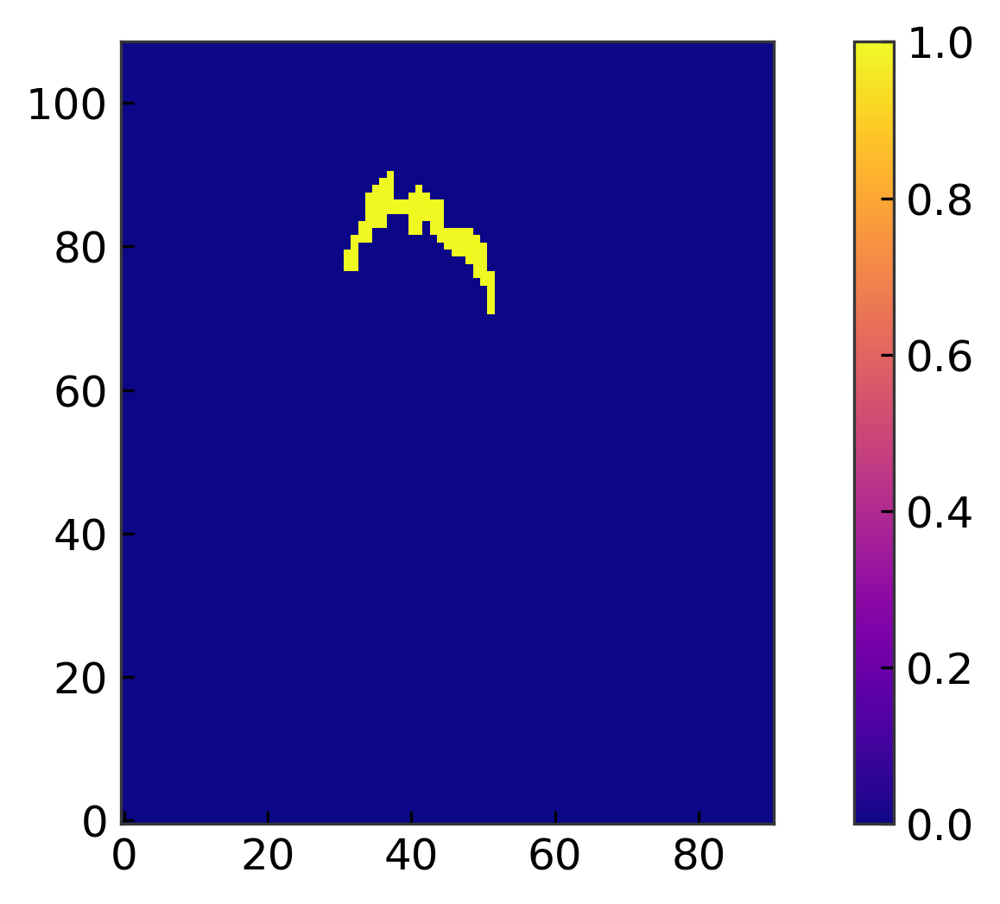

In [13]:
plt.imshow(data[50, :, :])
plt.imshow((data[50, :, :]==35)*np.ones(data[50, :, :].shape))
plt.colorbar()

In [14]:
# https://github.com/rscgh/brainorg/blob/main/MRI%20Data%20Cheet%20Sheet.md#get-mni-coordinate-for-a-specific-voxel
import nilearn.regions
import nilearn.masking
import nilearn.plotting

/home/cakan/anaconda/lib/python3.7/site-packages/nilearn/datasets/__init__.py:90: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [15]:
label_img = nilearn.regions.connected_label_regions(img)

In [16]:
test_img = nilearn.masking.compute_brain_mask(img)

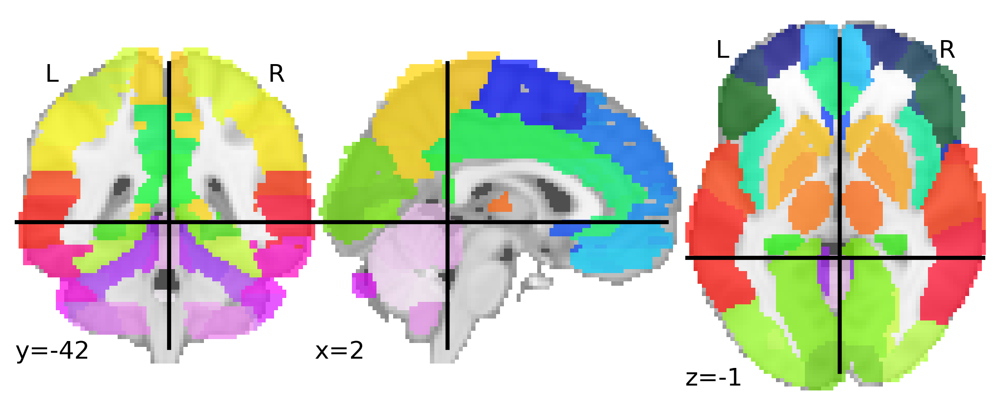

In [17]:
nilearn.plotting.plot_roi(img)

In [18]:
point_xyz = [100,30,50];
# to get the value at xyz: nimg.get_fdata()[100,30,50] -> i.e. 5

mni_coords = [np.int_(np.round(x)) for x in apply_affine(img.affine, point_xyz)]
print("Point: ", point_xyz, "has MNI coordinates: ", mni_coords);

Point:  [100, 30, 50] has MNI coordinates:  [-110, -66, 28]


In [19]:
np.unique(data[25, :, :].data)

array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,  28.,  30.,  32.,
        34.,  42.,  52.,  56.,  58.,  60.,  62.,  64.,  66.,  68.,  70.,
        84.,  86.,  88.,  90.,  92.,  94.,  96.,  98., 104., 106., 108.])

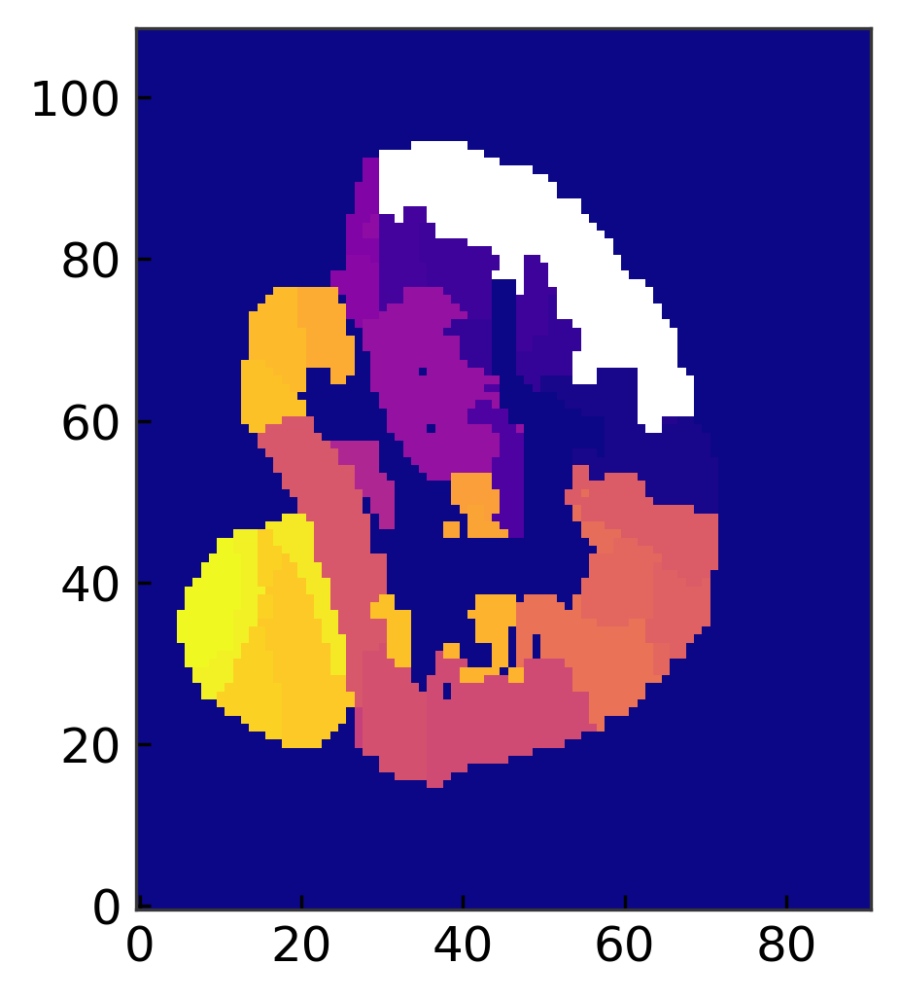

In [20]:
masked_data = np.ma.masked_where(data==6, data)
plt.imshow(masked_data[25, :, :])

# E field calculation

In [25]:
import os
import numpy as np
import simnibs
from nibabel.affines import apply_affine

img = nib.load("research_sleep_stimulus/data/aal/aal2.nii.gz")
head_mesh = simnibs.read_msh("research_sleep_stimulus/data/ernie/simulations/gw_correct_electrodes/ernie_TDCS_1_scalar.msh")
gray_matter = head_mesh.crop_mesh(2)
elm_centers = gray_matter.elements_baricenters()[:]
elm_vols = gray_matter.elements_volumes_and_areas()[:]

def get_e_field_from_volume(area, key="normE", debug=False):
    # https://simnibs.github.io/simnibs/build/html/tutorial/analysis.html
    data = img.get_fdata()
    # roi in mni space
    area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(img.get_fdata()==area))])
    # roi in subject space
    area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, 'research_sleep_stimulus/data/ernie/m2m_ernie/')
        
    # generate binary roi vector
    r = 3.
    roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])
    # get the element volumes, we will use those for averaging
    elm_vols = gray_matter.elements_volumes_and_areas()[:]
    
    
    # get norm electric field
    field = gray_matter.field[key][:]
    #field = gray_matter.field['E_normal'][:]
    # Calculate the mean
    mean_normE = np.average(field[roi], weights=elm_vols[roi])
    sum_normE = np.sum(field[roi]*elm_vols[roi])
    #sum_normE = np.sum(field[roi])
    
    if debug:
        ## Plot the ROI
        gray_matter.add_element_field(roi, 'roi')
        gray_matter.view(visible_fields='roi').show()
        print('mean ', field_name, ' in ROI: ', mean_normE)
    
    return elm_vols[roi], mean_normE, field[roi], elm_centers[roi], roi

In [26]:
vols, mean, field, centers, sums = get_e_field_from_volume(10)
[v.shape for v in [vols, mean, field, centers, sums]]

[(13085,), (), (13085,), (13085, 3), (980931,)]

In [27]:
# import os
# import numpy as np
# import simnibs
# from nibabel.affines import apply_affine

# img = nib.load("research_sleep_stimulus/data/aal/aal2.nii.gz")
# head_mesh = simnibs.read_msh("research_sleep_stimulus/data/ernie/simulations/gw_correct_electrodes/ernie_TDCS_1_scalar.msh")
# gray_matter = head_mesh.crop_mesh(2)
# elm_centers = gray_matter.elements_baricenters()[:]
# elm_vols = gray_matter.elements_volumes_and_areas()[:]

# def get_e_field_from_volume(area, key="normE", debug=False):
#     # https://simnibs.github.io/simnibs/build/html/tutorial/analysis.html
#     data = img.get_fdata()
#     # roi in mni space
#     area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(img.get_fdata()==area))])
#     # roi in subject space
#     area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, 'research_sleep_stimulus/data/ernie/m2m_ernie/')
        
#     # generate binary roi vector
#     r = 3.
#     roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])
#     # get the element volumes, we will use those for averaging
#     elm_vols = gray_matter.elements_volumes_and_areas()[:]
    
    
#     # get norm electric field
#     field = gray_matter.field[key][:]
#     #field = gray_matter.field['E_normal'][:]
#     # Calculate the mean
#     mean_normE = np.average(field[roi], weights=elm_vols[roi])
#     mean_normE_no_weight = np.average(field[roi])
#     #sum_normE = np.sum(field[roi])
    
#     if debug:
#         ## Plot the ROI
#         gray_matter.add_element_field(roi, 'roi')
#         gray_matter.view(visible_fields='roi').show()
#         print('mean ', field_name, ' in ROI: ', mean_normE)
    
#     return mean_normE_no_weight, mean_normE, field[roi]

In [28]:
img = nib.load("research_sleep_stimulus/data/aal/aal2.nii.gz")

overlay_gray_matter = simnibs.read_msh("research_sleep_stimulus/data/ernie/simulations/gw_correct_electrodes/subject_overlays/ernie_TDCS_1_scalar_central.msh")
#surface_elm_centers = overlay_gray_matter.elm_node_coords()[:]
surface_node_centers = overlay_gray_matter.nodes.node_coord[:]
#elm_centers = gray_matter.elements_baricenters()[:]
#elm_vols = gray_matter.elements_volumes_and_areas()[:]

# def get_e_field_from_surface(area, key="E_normal", debug=False):
#     area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(img.get_fdata()==area))])
#     # roi in subject space
#     area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, 'research_sleep_stimulus/data/ernie/m2m_ernie/')
    
#     r = 3.
#     roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in overlay_gray_matter.nodes.node_coord])
    
#     field = overlay_gray_matter.field[key]
#     mean_E_tangent = np.average(field[roi])
#     sum_E_tangent = np.sum(field[roi])    
#     return sum_E_tangent, mean_E_tangent, field[roi]

def get_e_field_from_surface(area, key="E_normal", debug=False):
    area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(img.get_fdata()==area))])
    # roi in subject space
    area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, 'research_sleep_stimulus/data/ernie/m2m_ernie/')
    
    r = 3.
    roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in overlay_gray_matter.nodes.node_coord])
    
    # calculate the node areas, we will use those later for averaging
    node_areas = overlay_gray_matter.nodes_areas()
    
    field = overlay_gray_matter.field[key]
    mean_field = np.average(field[roi], weights=node_areas[roi])
    sum_field = np.sum(field[roi]*node_areas[roi])
 
    return node_areas[roi], mean_field, field[roi], surface_node_centers[roi], roi, sum_field

def wrapper_norm(area):
    return get_e_field_from_surface(area, key="E_norm")
def wrapper_normal(area):
    return get_e_field_from_surface(area, key="E_normal")
def wrapper_tangent(area):
    return get_e_field_from_surface(area, key="E_tangent")

In [29]:
vols, mean, field, centers, roi, sum_field = get_e_field_from_surface(10)
[v.shape for v in [vols, mean, field, centers, roi, sum_field]]

[(4316,), (), (4316,), (4316, 3), (267855,), ()]

# Generate vector component summaries

## E field surface

In [30]:
# On Okda
import multiprocessing as mp
inputs = np.unique(data)[1:]
subcortical_index = np.array(list(range(40, 46)) + list(range(74, 82)) + list(range(94, 120)))
inputs = np.delete(inputs, subcortical_index)

print("Calculating results_tangent")
pool = mp.Pool(processes=80)
results_tangent = pool.map(wrapper_tangent, inputs)
pool.close()

print("Calculating results_normal")
pool = mp.Pool(processes=80)
results_normal = pool.map(wrapper_normal, inputs)
pool.close()

Calculating results_tangent
Calculating results_normal


In [31]:
print("Calculating results_norm")
pool = mp.Pool(processes=80)
results_norm = pool.map(wrapper_norm, inputs)
pool.close()

Calculating results_norm


Down transitions: slope: 0.00018547876570234668 r: 0.7701028956278239, p: 6.855674360510732e-17


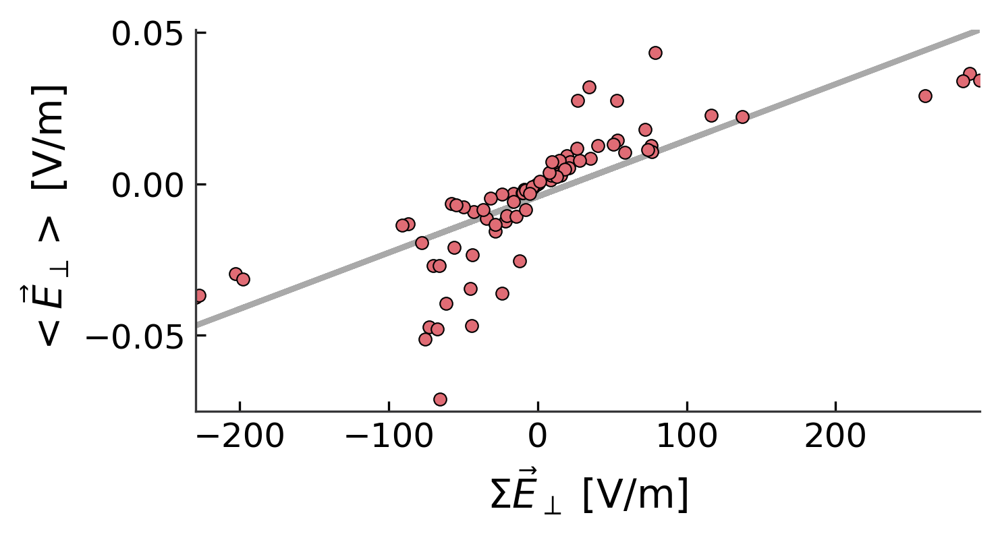

In [89]:
plt.figure(figsize=(5, 2.5), dpi=300)
scattery = np.array([r[1] for r in results_normal])
scatterx = np.array([r[5] for r in results_normal])
plt.scatter(scatterx, scattery, s=20, ec='k', lw=0.5, label="Brain area (AAL2)")
# for n in range(len(results_normal)):
#     plt.text(results_normal[n][5]+5, results_normal[n][1], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("$\Sigma \\vec{E}_\\perp$ [V/m]")
plt.ylabel("$<\\vec{E}_\\perp>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)
plt.savefig("research_sleep_stimulus/figures/correlation_sum_vs_avg.pdf", bbox_inches = 'tight')

Down transitions: slope: -0.140765289533669 r: -0.20057342568258896, p: 0.07443593179624404


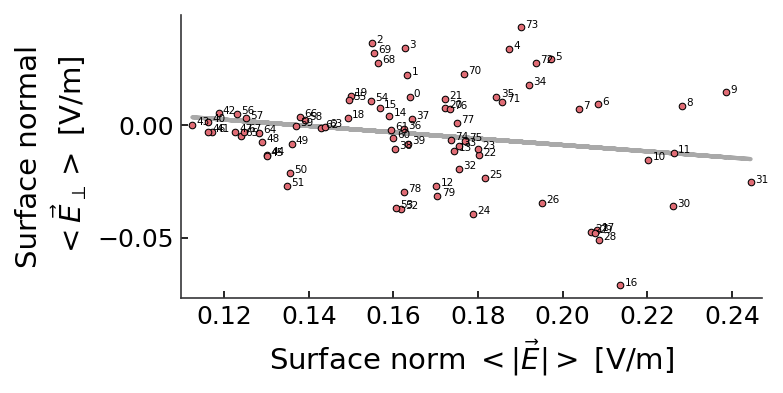

In [32]:
plt.figure(figsize=(5, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_norm])
scattery = np.array([r[1] for r in results_normal])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(results_norm)):
    plt.text(results_norm[n][1]+0.001, results_normal[n][1], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface norm $<|\\vec{E}|>$ [V/m]")
plt.ylabel("Surface normal\n$<\\vec{E}_\\perp>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

Down transitions: slope: 0.7336594533171068 r: 0.5890357476870715, p: 9.06233363426489e-09


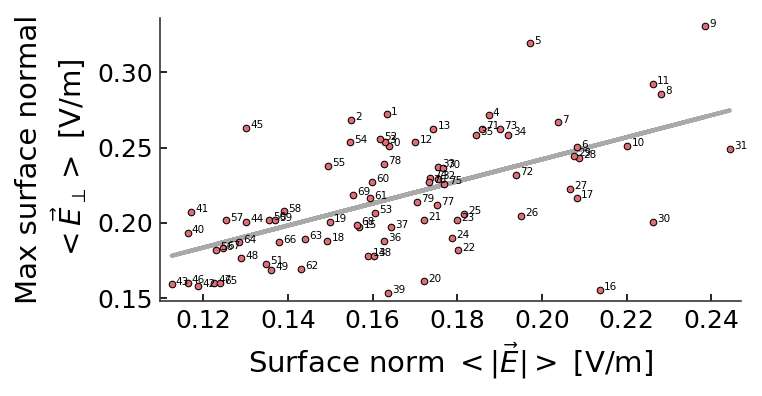

In [33]:
plt.figure(figsize=(5, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_norm])
scattery = np.array([np.max(r[2]) for r in results_normal])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(scatterx)):
    plt.text(scatterx[n]+0.001, scattery[n], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface norm $<|\\vec{E}|>$ [V/m]")
plt.ylabel("Max surface normal\n$<\\vec{E}_\\perp>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

Down transitions: slope: -0.8023823559677634 r: -0.49697954730036226, p: 2.742718527540186e-06


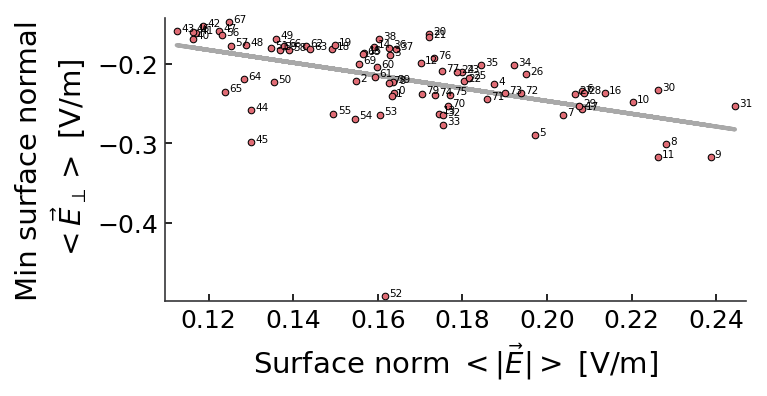

In [34]:
plt.figure(figsize=(5, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_norm])
scattery = np.array([np.min(r[2]) for r in results_normal])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(scatterx)):
    plt.text(scatterx[n]+0.001, scattery[n], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface norm $<|\\vec{E}|>$ [V/m]")
plt.ylabel("Min surface normal\n$<\\vec{E}_\\perp>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

Down transitions: slope: 0.8555579199551311 r: 0.93748865186397, p: 1.684663168813644e-37


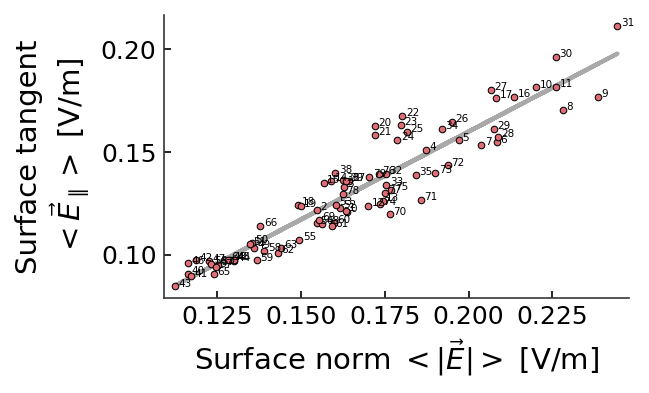

In [35]:
plt.figure(figsize=(4, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_norm])
scattery = np.array([r[1] for r in results_tangent])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(results_norm)):
    plt.text(results_norm[n][1]+0.001, results_tangent[n][1], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface norm $<|\\vec{E}|>$ [V/m]")
plt.ylabel("Surface tangent\n$<\\vec{E}_\\parallel>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

Down transitions: slope: -0.3632622545171189 r: -0.279356681655803, p: 0.0120904225482659


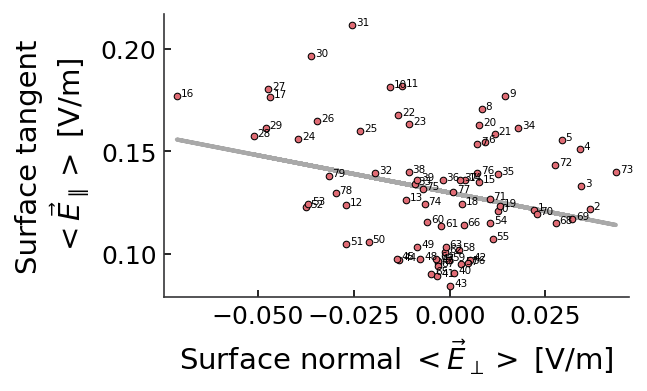

In [36]:
plt.figure(figsize=(4, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_normal])
scattery = np.array([r[1] for r in results_tangent])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(results_norm)):
    plt.text(results_normal[n][1]+0.001, results_tangent[n][1], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface normal $<\\vec{E}_\\perp>$ [V/m]")
plt.ylabel("Surface tangent\n$<\\vec{E}_\\parallel>$ [V/m]")

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

## E field volume

In [593]:
# On Okda
print("Calculating results_volume_norm")
pool = mp.Pool(processes=80)
results_volume_norm = pool.map(get_e_field_from_volume, inputs)
pool.close()

Calculating results_volume_norm


Down transitions: slope: 0.9912917685979565 r: 0.997274719703468, p: 4.505744744722376e-90


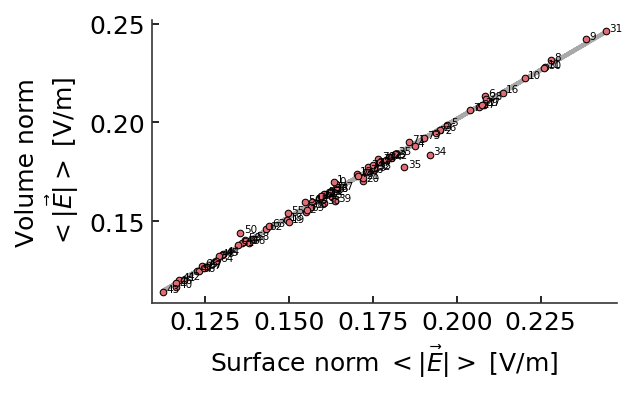

In [594]:
plt.figure(figsize=(4, 2.5), dpi=150)
scatterx = np.array([r[1] for r in results_norm])
scattery = np.array([r[1] for r in results_volume_norm])
plt.scatter(scatterx, scattery, s=10, ec='k', lw=0.5, label="Brain area (AAL2)")
for n in range(len(results_norm)):
    plt.text(results_norm[n][1]+0.001, results_volume_norm[n][1], f"{n}", fontsize=5)
# plt.legend(fontsize=10)
plt.xlabel("Surface norm $<|\\vec{E}|>$ [V/m]", fontsize=12)
plt.ylabel("Volume norm\n$<|\\vec{E}|>$ [V/m]", fontsize=12)

ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# ax.spines["left"].set_visible(False)
# ax.spines["bottom"].set_visible(False)

down_slope, down_intercept, down_r_value, down_p_value, down_std_err = stats.linregress(
    scatterx, scattery
)
print(f"Down transitions: slope: {down_slope} r: {down_r_value}, p: {down_p_value}")
plt.plot(scatterx, (lambda c: down_intercept + down_slope * c)(scatterx), c="darkgray", label="x", zorder=-5)

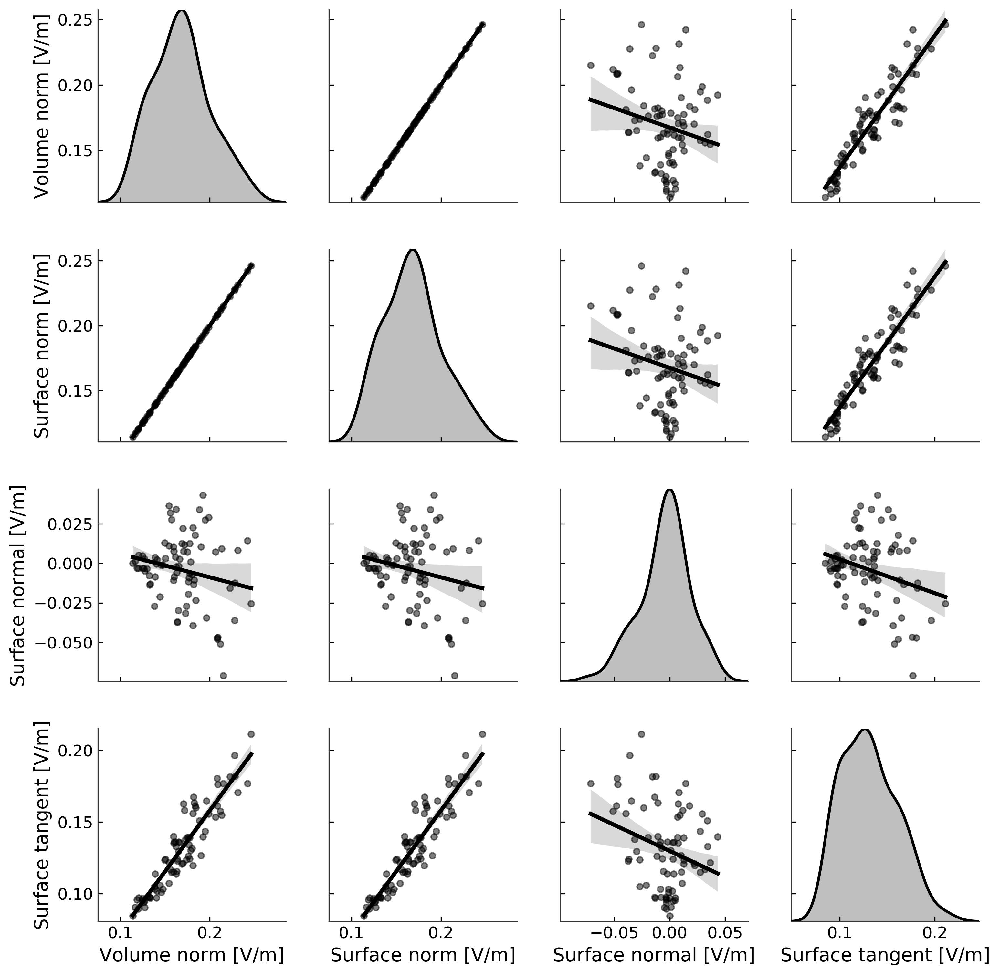

In [595]:
import pandas as pd
import seaborn as sns

df = pd.DataFrame(data={
    "Volume norm [V/m]": [r[1] for r in results_volume_norm], 
    "Surface norm [V/m]": [r[1] for r in results_volume_norm],
    "Surface normal [V/m]": [r[1] for r in results_normal],
    "Surface tangent [V/m]": [r[1] for r in results_tangent],
    })

color = "k"
_line_kws = {"color": color}
# _line_kws.update(line_kws)
_scatter_kws = {"alpha": 0.5, "color": color, "s":20}
# _scatter_kws.update(scatter_kws)

sm = sns.pairplot(
    df,
    diag_kind="kde",
    kind="reg",
    plot_kws={
        "line_kws": _line_kws,
        "scatter_kws": _scatter_kws,
    },
    diag_kws={"color": color},
#     height=10, aspect=0.6
)

# 

## These histograms are not across the averaged data (per roi) from above but across all voxels and rois

In [628]:
def flatten_rois(field):
    all_rois = []
    for r in field:
        for f, a in zip(r[2], r[0]):
            # needs to be normalized by area/volume
            all_rois.append(f*a)
    return np.array(all_rois)

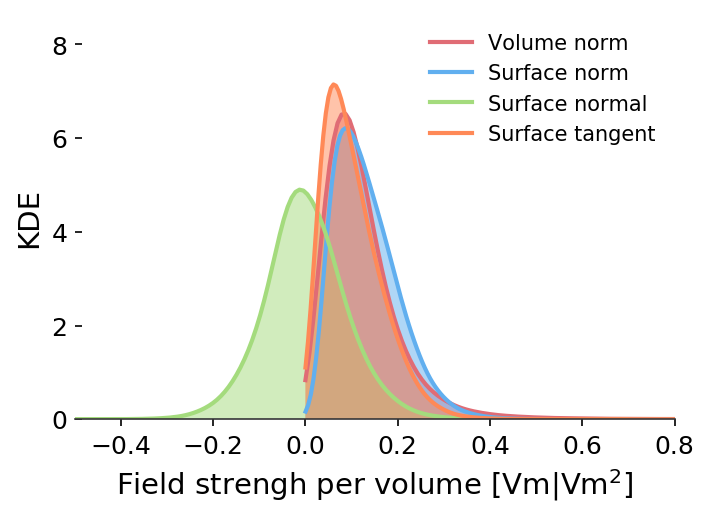

In [651]:
figsize = (4, 2.7)
# figsize = np.multiply(figsize, 0.75)
plt.figure(figsize=figsize, dpi=150)
results = [results_volume_norm, results_norm, results_normal, results_tangent]
labels = ["Volume norm", "Surface norm", "Surface normal", "Surface tangent"]
colors = ["C0", "C1", "C2", "C3"]

from scipy.stats import gaussian_kde

for i, r in enumerate(results):
    all_rois = flatten_rois(r)
    weights = np.ones_like(all_rois) / len(all_rois) * 100
#     N, bins, patches = plt.hist(all_rois, bins=20, weights=weights, rwidth=0.8, edgecolor="lightgray", label=labels[i], color=colors[i])
#     plt.plot(bins[1:]-((bins[1]-bins[0])/2), N,color=colors[i])
    density = gaussian_kde(all_rois)
    density.covariance_factor = lambda : .25
    density._compute_covariance()
    xs = np.linspace(np.min(all_rois), np.max(all_rois), 200)
    ds = density(xs)
    plt.plot(xs, ds, label=labels[i], color=colors[i])
    plt.fill_between(xs, 0, ds, alpha=0.5)
    
max_y = plt.gca().get_ylim()[1] * 1.1

# plt.xticks([0, 50, 100])

plt.ylabel("KDE")
plt.xlabel("Field strengh per volume [Vm|Vm$^2$]")
plt.gca().tick_params(axis="x", direction="out", which="major", bottom=True, left=True)
# plt.xlim([0, 100])
ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
# ax.spines["bottom"].set_visible(False)

plt.ylim(0, max_y * 1.1)
# if remove_xticks:
#     plt.yticks([])
# else:
#     y_vals = plt.gca().get_yticks()
#     print(y_vals)
#     # plt.gca().set_yticklabels(["{:3.0f}".format(x * 100) for x in y_vals])
# plt.vlines([50], 0, max_y, linestyles="--", colors="#363638", alpha=0.9)

plt.xlim(-0.5, 0.8)
plt.legend(fontsize=10, loc=0, frameon=False)
plt.tight_layout()
bp.set_axis_size(*figsize)

[-0.22689245]
[-0.19876083]
[-0.14771451]
[-0.14876472]
[-0.177659]
[-0.18076183]
[-0.2339812]
[-0.22873074]
[-0.24806351]
[-0.22337324]
[-0.27304762]
[-0.24775758]
[-0.30457148]
[-0.27218793]
[-0.22037155]
[-0.19908467]
[-0.38229061]
[-0.32450571]
[-0.19836548]
[-0.18576986]
[-0.17237333]
[-0.17972673]
[-0.21944141]
[-0.26027439]
[-0.34820847]
[-0.29544287]
[-0.33858339]
[-0.37642365]
[-0.36726461]
[-0.33535382]
[-0.32315879]
[-0.26505858]
[-0.22253293]
[-0.22124825]
[-0.17400432]
[-0.2214515]
[-0.22558361]
[-0.22042796]
[-0.22883316]
[-0.23957104]
[-0.22337129]
[-0.23021601]
[-0.2016906]
[-0.23381152]
[-0.27779106]
[-0.26163931]
[-0.23503292]
[-0.23682693]
[-0.27172021]
[-0.27289316]
[-0.29525435]
[-0.33274478]
[-0.35004057]
[-0.33312585]
[-0.20812931]
[-0.22441903]
[-0.20033563]
[-0.22676981]
[-0.23641749]
[-0.26967115]
[-0.25002256]
[-0.257912]
[-0.22649571]
[-0.25729428]
[-0.23614354]
[-0.24842916]
[-0.21707015]
[-0.27437981]
[-0.20949241]
[-0.16682264]
[-0.21164119]
[-0.22727346]

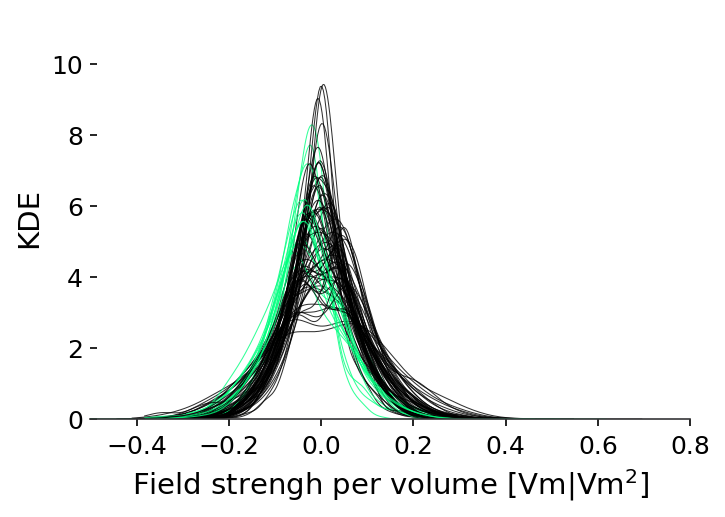

In [826]:
figsize = (4, 2.7)
# figsize = np.multiply(figsize, 0.75)
plt.figure(figsize=figsize, dpi=150)

# results = [results_volume_norm, results_norm, results_normal, results_tangent]
# labels = ["Volume norm", "Surface norm", "Surface normal", "Surface tangent"]

results = [results_normal]
labels = ["Surface normal"]
colors = ["C0", "C1", "C2", "C3"]

from scipy.stats import gaussian_kde

for i, r in enumerate(results):
    for roi in r:
        all_vectors = np.array([f*a for f, a in zip(roi[2], roi[0])])
        weights = np.ones_like(all_vectors) / len(all_vectors) * 100
    #     N, bins, patches = plt.hist(all_rois, bins=20, weights=weights, rwidth=0.8, edgecolor="lightgray", label=labels[i], color=colors[i])
    #     plt.plot(bins[1:]-((bins[1]-bins[0])/2), N,color=colors[i])
        density = gaussian_kde(all_vectors)
        density.covariance_factor = lambda : .25
        density._compute_covariance()
        xs = np.linspace(np.min(all_vectors), np.max(all_vectors), 200)
        ds = density(xs)
        print(stats.mode(xs*ds).mode)
        plt.plot(xs, ds, label=labels[i], color='k' if np.abs(stats.mode(xs*ds).mode) < 0.3 else "springgreen", lw=0.5, alpha=0.8)
#         plt.fill_between(xs, 0, ds, alpha=0.5)
    
max_y = plt.gca().get_ylim()[1] * 1.1

# plt.xticks([0, 50, 100])

plt.ylabel("KDE")
plt.xlabel("Field strengh per volume [Vm|Vm$^2$]")
plt.gca().tick_params(axis="x", direction="out", which="major", bottom=True, left=True)
# plt.xlim([0, 100])
ax = plt.gca()
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
# ax.spines["bottom"].set_visible(False)

plt.ylim(0, max_y * 1.1)
# if remove_xticks:
#     plt.yticks([])
# else:
#     y_vals = plt.gca().get_yticks()
#     print(y_vals)
#     # plt.gca().set_yticklabels(["{:3.0f}".format(x * 100) for x in y_vals])
# plt.vlines([50], 0, max_y, linestyles="--", colors="#363638", alpha=0.9)

plt.xlim(-0.5, 0.8)
# plt.legend(fontsize=10, loc=0, frameon=False)
plt.tight_layout()
bp.set_axis_size(*figsize)

# Save data

In [793]:
import pickle
# pickle.dump(results_tangent, open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_tangent.p', 'wb+'))
# pickle.dump(results_normal, open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_normal.p', 'wb+'))
# pickle.dump(results_norm, open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_norm.p', 'wb+'))
# pickle.dump(results_volume_norm, open('research_sleep_stimulus/data/result_gw_correct_electrodes_volume_norm.p', 'wb+'))

# Analyse results

In [601]:
import pickle
results_tangent = pickle.load(open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_tangent.p', 'rb+'))
results_normal = pickle.load(open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_normal.p', 'rb+'))
results_norm = pickle.load(open('research_sleep_stimulus/data/result_gw_correct_electrodes_surface_norm.p', 'rb+'))
results_volume_norm = pickle.load(open('research_sleep_stimulus/data/result_gw_correct_electrodes_volume_norm.p', 'rb+'))

In [47]:
# sanity check whether E_tangent^2 + E_normal^2 == E_norm^2
np.max([np.max(np.square(results_tangent[i][2]) +  np.square(results_normal[i][2]) - np.square(results_norm[i][2])) for i in range(len(results_tangent))])

2.7755575615628914e-17

In [147]:
import neurolib.utils.brainplot as bp
from neurolib.models.aln import ALNModel
from neurolib.utils.loadData import Dataset
ds = Dataset("gw", fcd=True)
model = ALNModel(Cmat = ds.Cmat, Dmat = ds.Dmat)
model.run()

INFO:root:Loading dataset gw from /mnt/antares_raid/home/cakan/projects/neurolib/neurolib/utils/../data/datasets/gw.
INFO:root:Computing FCD matrices ...
INFO:root:Dataset gw loaded.
INFO:root:aln: Model initialized.


INFO:root:Defaulting to 20 frames at 10 fp/s
  5%|▌         | 1/20 [00:00<00:01, 15.39it/s]


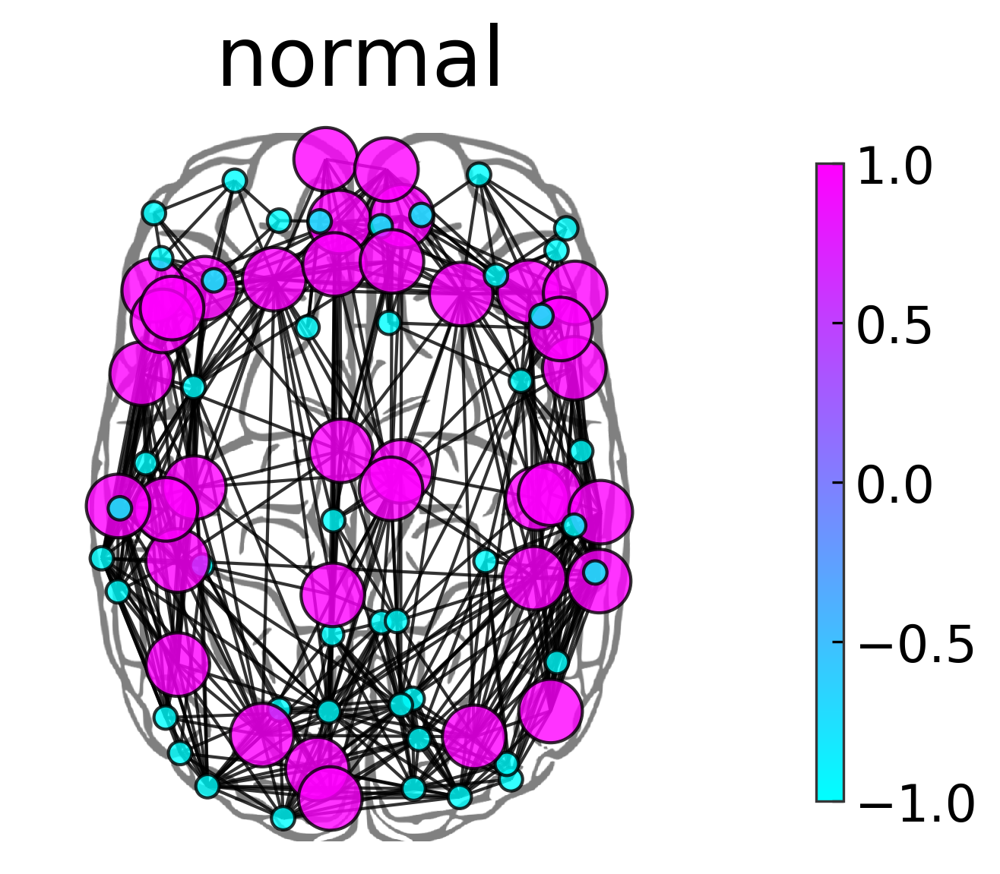

In [148]:
bp.plot_brain(model, ds, color=[1 if r[1]>0 else -1 for r in results_normal], title='normal', cmap='cool')
plt.show()
bp.plot_brain(model, ds, color=[r[0] for r in results_normal], title='Surface normal', cmap='cool')
plt.show()
bp.plot_brain(model, ds, color=[r[1] for r in results_normal], title='Surface normal', cmap='cool')
plt.show()
bp.plot_brain(model, ds, color=[r[1] for r in results_tangent], title='Surface tangent', cmap='cool')
plt.show()
bp.plot_brain(model, ds, color=[r[1] for r in results_norm], title='Surface norm', cmap='cool')
plt.show()
bp.plot_brain(model, ds, color=[r[1] for r in results_volume_norm], title='Volume norm', cmap='cool')
plt.show()

## nilearn brain

In [48]:
coords_ar = np.array(atlas.coords())
print(coords_ar[0])
print(np.mean(coords_ar, axis=0))
coords_ar = coords_ar - np.mean(coords_ar, axis=0)
print(coords_ar[0])

NameError: name 'atlas' is not defined

In [50]:
from neurolib.utils import atlases

def all_nilearn_coords():
    def x_rotation(vector,theta):
        """Rotates 3-D vector around x-axis"""
        R = np.array([[1,0,0],[0,np.cos(theta),-np.sin(theta)],[0, np.sin(theta), np.cos(theta)]])
        return np.dot(R,vector)

    def y_rotation(vector,theta):
        """Rotates 3-D vector around y-axis"""
        R = np.array([[np.cos(theta),0,np.sin(theta)],[0,1,0],[-np.sin(theta), 0, np.cos(theta)]])
        return np.dot(R,vector)

    def z_rotation(vector,theta):
        """Rotates 3-D vector around z-axis"""
        R = np.array([[np.cos(theta), -np.sin(theta),0],[np.sin(theta), np.cos(theta),0],[0,0,1]])
        return np.dot(R,vector)

    coords = {}
    atlas = atlases.AutomatedAnatomicalParcellation2()
    for i, c in enumerate(atlas.coords()):
        coords[i] = [c[0], c[1]]
    coords_ar = np.array(atlas.coords())

    coords_ar = coords_ar - np.mean(coords_ar, axis=0)

    print(coords_ar[0])

    for i, c in enumerate(coords_ar):
        coords_ar[i] = y_rotation(c, -0.05)

    for i, c in enumerate(coords_ar):
        coords_ar[i] = x_rotation(c, -0.3)

    for i, c in enumerate(coords_ar):
        coords_ar[i] = z_rotation(c, -0.02)    

    coords_ar[:, 0] -= 0
    coords_ar[:, 1] -= 13
    coords_ar[:, 2] += 18
    coords_ar *= 0.8
    coords_ar[:, 2] *= 1.1
    return coords_ar

coords_ar = all_nilearn_coords()
print(coords_ar[0])

[-49.43288287  -3.83952841  46.28180149]
[-41.19093387  -2.16502409  53.62176778]


In [51]:
for c in coords_ar:
    print(f"{c[0]} {c[1]} {c[2]}")

-41.190933874579315 -2.1650240862349963 53.62176777671028
40.94135091919926 -6.194541380674926 54.90121618084047
-21.076354369693522 45.181712271544725 37.56275778953347
23.62573741654127 41.12674317947215 39.57048273983625
-37.464639054206074 41.80233374467637 32.368898201883724
40.248971086942774 39.18928549452634 31.783427509945387
-52.26315253319169 17.431260171778632 20.88729986299363
51.36536249819691 17.06888596636764 22.22112341762745
-49.03114282275925 36.68820605609133 15.221134300558845
51.995036981280634 33.832244404270305 14.605145395132554
-46.30545205365071 38.71938216943093 -5.959872391007912
48.46967084160323 38.65372871807372 -6.421606102296244
-51.20397449773114 -6.342400494860804 16.345057488407058
53.19340943281648 -5.463573172096771 16.11936030517973
-6.415507072566554 9.403930448466822 64.42454182215225
7.847059758421608 4.171171317509649 65.233790540483
-11.079125507905196 18.988017128621976 -11.883779832771554
8.457407669095591 19.776409823576643 -11.7765516244

In [52]:
nilearn_plot_markers(color = np.array([r[1] for r in results_normal]), title="Surface normal")

NameError: name 'nilearn_plot_markers' is not defined

In [53]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to 
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False), 
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = matplotlib.colors.LinearSegmentedColormap(name, cdict)
    plt.register_cmap(cmap=newcmap)

    return newcmap


In [92]:
from nilearn.plotting import plot_markers
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def nilearn_plot_markers(color=None, label=None, cmap=None, title=None, fname=None, cm=None):
    size = np.abs(color) 
    size -= np.min(size)
    size /= np.max(size) 
    size *= 250
    f, ax = plt.subplots()
    
    # automatic colormap
    if cmap is None:
        midpoint = 1-abs(np.max(color)) / (np.max(color) + abs(np.min(color)))
        cmap = shiftedColorMap(cm or mpl.cm.coolwarm, midpoint=midpoint)
        if np.max(color) < 0:
            cmap = shiftedColorMap(mpl.cm.Blues_r, midpoint=midpoint)
        elif np.min(color) > 0:
            cmap = shiftedColorMap(mpl.cm.Reds, midpoint=midpoint)
    
    plot_markers(color, coords_ar, node_size=size, figure=f, alpha=1, node_cmap=cmap, node_kwargs={"edgecolor" : "k"}, colorbar=False)
    
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["bottom"].set_visible(False)
    ax.get_xaxis().set_ticks([])
    ax.get_yaxis().set_ticks([])

    if title is not None:
        plt.title(title)
    cax = inset_axes(ax, width="30%", height="3%", loc='lower left', borderpad=-1, axes_kwargs={})
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=np.min(color), vmax=np.max(color)))
    cbar = plt.colorbar(sm, cax=cax, orientation = "horizontal")
    cbar.set_label(label=label or 'Average field [V/m]',fontsize=10)
    cbar.ax.tick_params(labelsize=10) 
    if fname:
        print("saving to", fname)
        plt.savefig(fname, bbox_inches = 'tight')
    plt.show()
    

saving to research_sleep_stimulus/figures/pattern_surface_normal_average.pdf


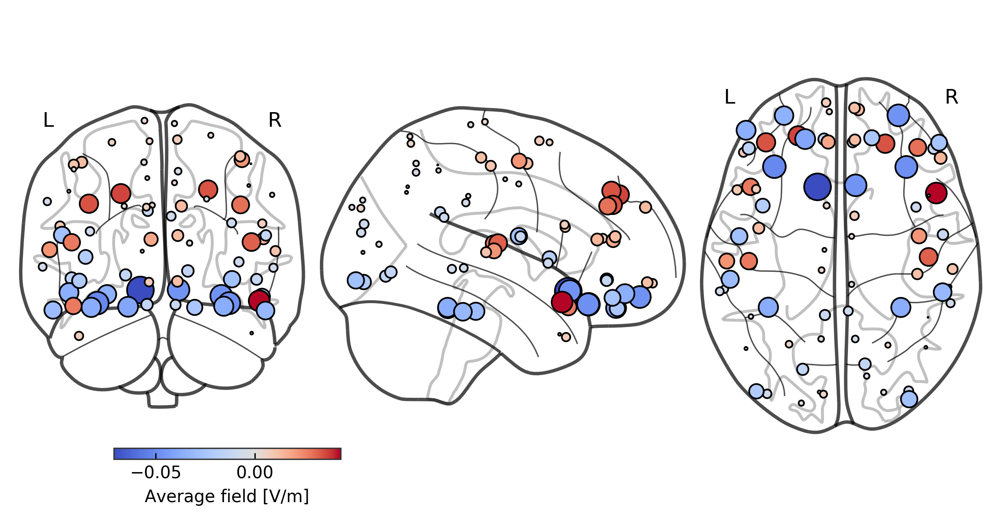

In [93]:
nilearn_plot_markers(color = np.array([r[1] for r in results_normal]), fname="research_sleep_stimulus/figures/pattern_surface_normal_average.pdf")


saving to research_sleep_stimulus/figures/pattern_surface_normal_zscored_sum_minus_average.pdf


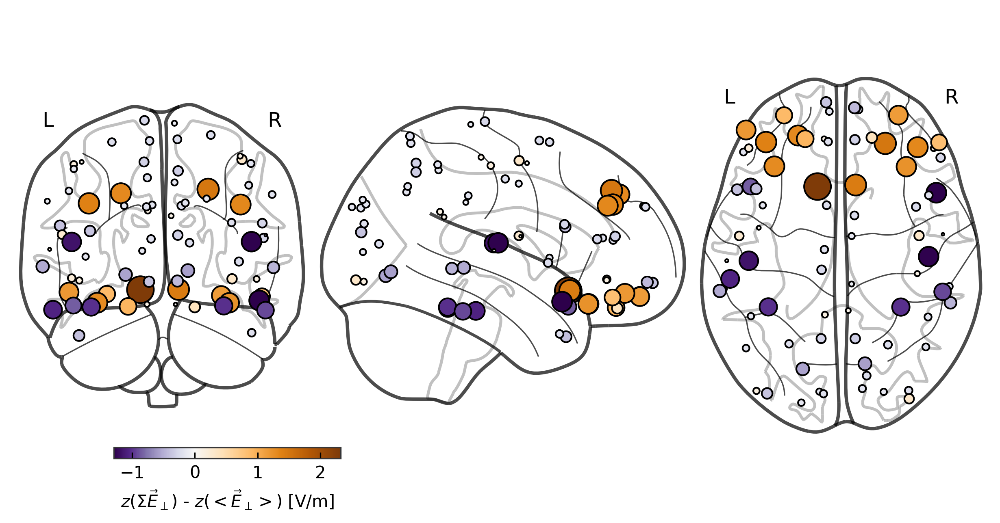

In [88]:
# difference between z-scored average field and summed field for surface normal 
average_field = [r[1] for r in results_normal]
average_field -= np.mean(average_field)
average_field /= np.std(average_field)
summed_field = [r[5] for r in results_normal]
summed_field -= np.mean(summed_field)
summed_field /= np.std(summed_field)
nilearn_plot_markers(
    color = np.array(summed_field)-np.array(average_field), 
    label="$z(\Sigma \\vec{E}_\\perp)$ - $z(<\\vec{E}_\\perp>)$ [V/m]",
    fname="research_sleep_stimulus/figures/pattern_surface_normal_zscored_sum_minus_average.pdf",
    cm=mpl.cm.PuOr_r
)

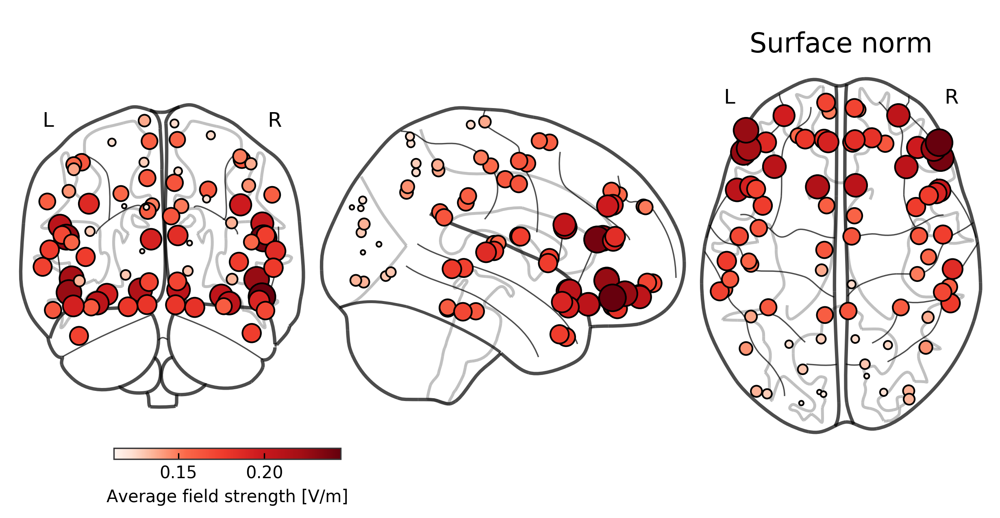

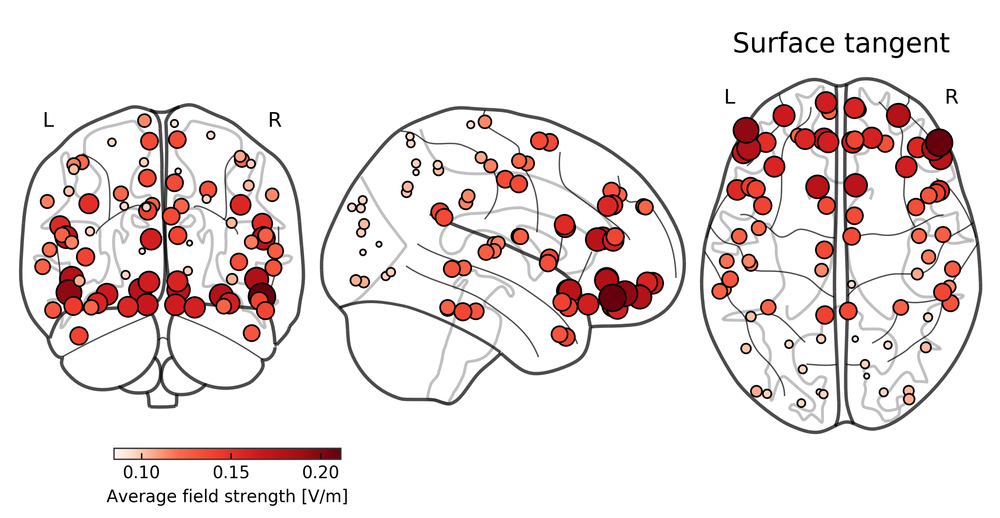

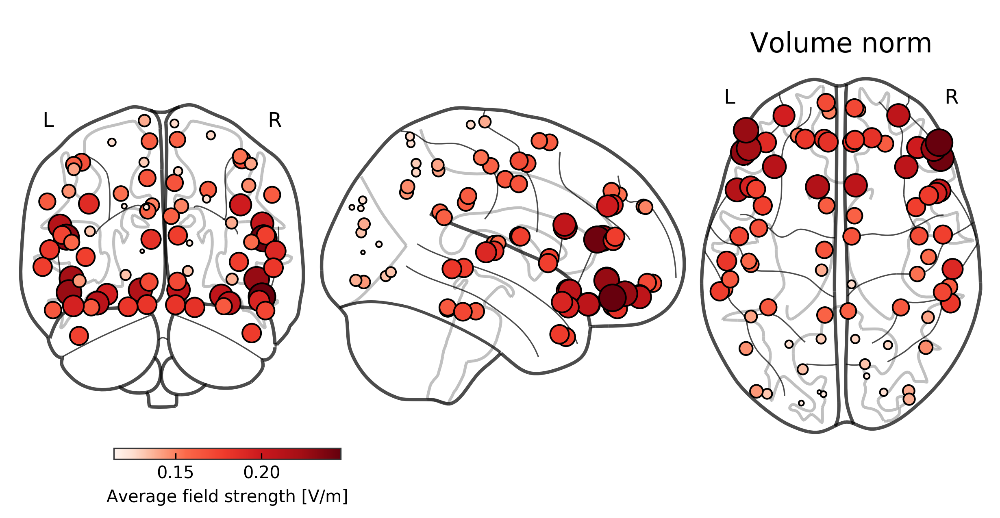

In [771]:
nilearn_plot_markers(color = np.array([r[1] for r in results_norm]), title="Surface norm")
nilearn_plot_markers(color = np.array([r[1] for r in results_tangent]), title="Surface tangent")
nilearn_plot_markers(color = np.array([r[1] for r in results_volume_norm]), title="Volume norm")

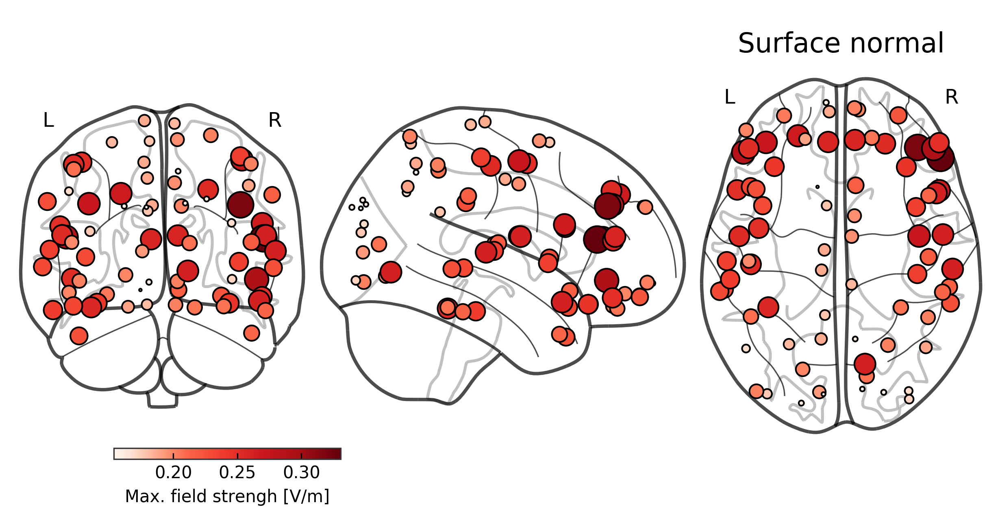

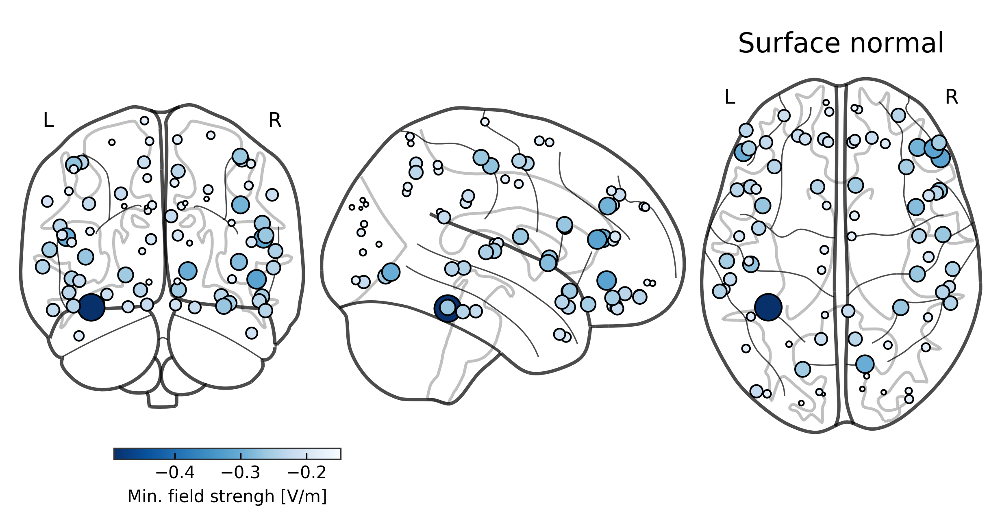

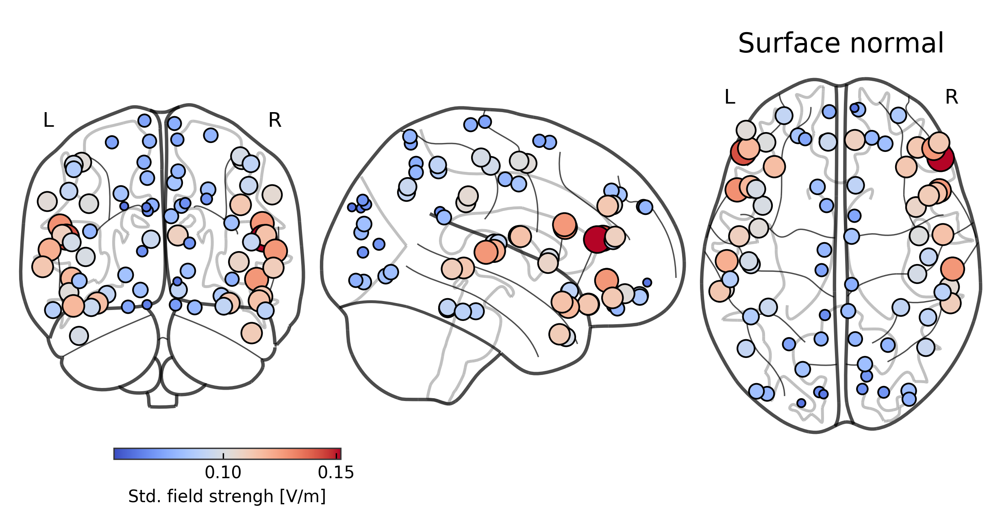

In [772]:
nilearn_plot_markers(color = np.array([np.max(r[2]) for r in results_normal]), label="Max. field strengh [V/m]", title="Surface normal")
nilearn_plot_markers(color = np.array([np.min(r[2]) for r in results_normal]), label="Min. field strengh [V/m]", title="Surface normal")
nilearn_plot_markers(color = np.array([np.std(r[2]) for r in results_normal]), label="Std. field strengh [V/m]", cmap=mpl.cm.coolwarm, title="Surface normal")

## Sum of field per area

In [ ]:
#     field = overlay_gray_matter.field[key]
#     mean_field = np.average(field[roi], weights=node_areas[roi])
#     return node_areas[roi], mean_field, field[roi], surface_node_centers[roi], roi

saving to research_sleep_stimulus/figures/pattern_surface_normal_sum.pdf


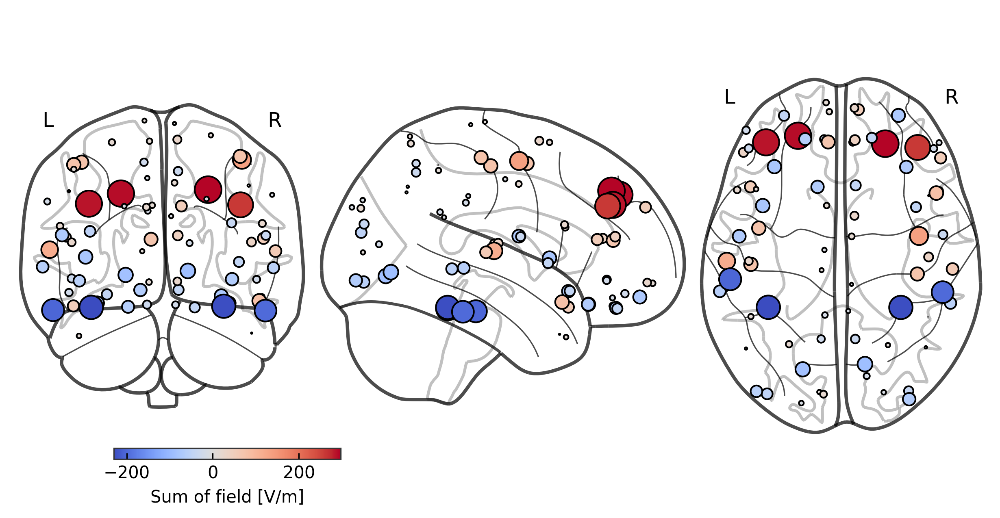

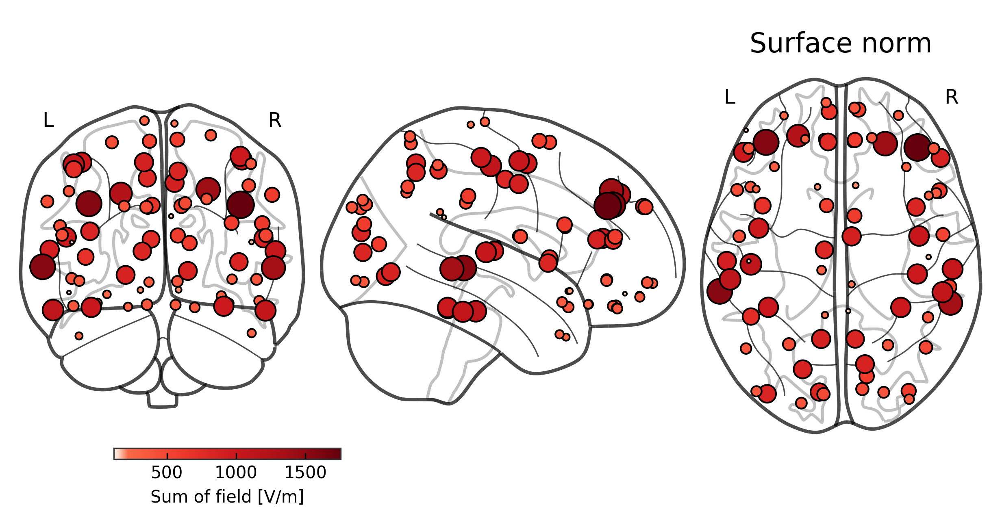

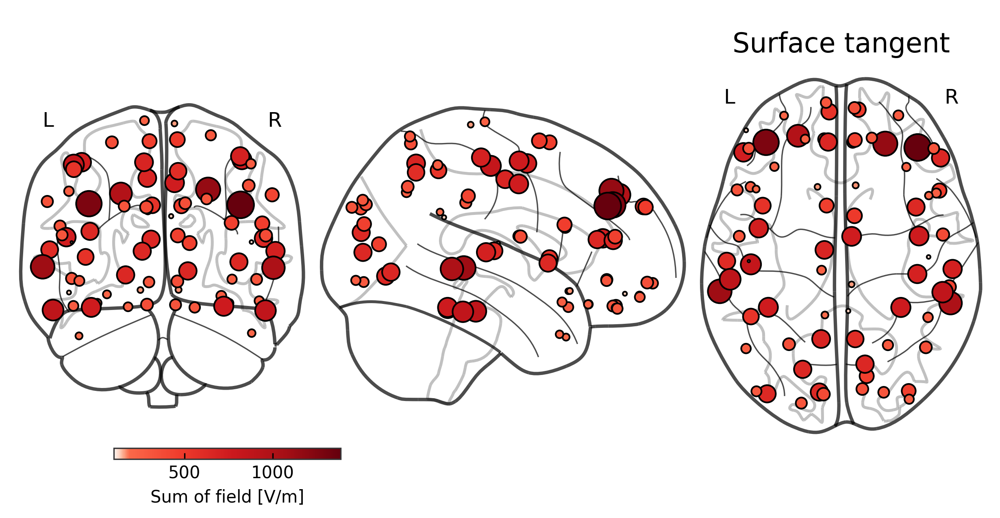

NameError: name 'results_volume_norm' is not defined

In [90]:
nilearn_plot_markers(color = np.array([np.sum(r[2]*r[0]) for r in results_normal]), label="Sum of field [V/m]", fname="research_sleep_stimulus/figures/pattern_surface_normal_sum.pdf")
nilearn_plot_markers(color = np.array([np.sum(r[2]*r[0]) for r in results_norm]), title="Surface norm", label="Sum of field [V/m]")
nilearn_plot_markers(color = np.array([np.sum(r[2]*r[0]) for r in results_tangent]), title="Surface tangent", label="Sum of field [V/m]")
nilearn_plot_markers(color = np.array([np.sum(r[2]*r[0]) for r in results_volume_norm]), title="Volume norm", label="Sum of field [V/m]")

### Plot voxel field

In [528]:
stat_img

'/home/cakan/nilearn_data/neurovault/collection_658/image_10426.nii.gz'

In [718]:
np.argwhere(img.get_fdata()[:, :, 16:17]>0).shape

(1727, 3)

In [712]:
img_data = img.get_fdata()
img_data[:, :, 16] != 0

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [781]:
import os
import numpy as np
import simnibs
from nibabel.affines import apply_affine

img = nib.load("research_sleep_stimulus/data/aal/aal2.nii.gz")
head_mesh = simnibs.read_msh("research_sleep_stimulus/data/ernie/simulations/gw_correct_electrodes/ernie_TDCS_1_scalar.msh")
gray_matter = head_mesh.crop_mesh(2)
elm_centers = gray_matter.elements_baricenters()[:]
elm_vols = gray_matter.elements_volumes_and_areas()[:]
key = "normE"
# def field_volume_slice(area, key="normE", debug=False):
    # https://simnibs.github.io/simnibs/build/html/tutorial/analysis.html
data = img.get_fdata()
# roi in mni space
area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(img.get_fdata()[:, :, 26:27]>0))])
# roi in subject space
area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, 'research_sleep_stimulus/data/ernie/m2m_ernie/')

# generate binary roi vector
r = 3.
roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])
# get the element volumes, we will use those for averaging
elm_vols = gray_matter.elements_volumes_and_areas()[:]


# get norm electric field
field = gray_matter.field[key][:]
#field = gray_matter.field['E_normal'][:]
# Calculate the mean
mean_normE = np.average(field[roi], weights=elm_vols[roi])

#     return elm_vols[roi], mean_normE, field[roi], elm_centers[roi], roi

In [786]:
elm_centers[roi].shape

(737, 3)

In [788]:
field

array([0.13936297, 0.15260517, 0.17584243, ..., 0.17507939, 0.16893311,
       0.23920181])

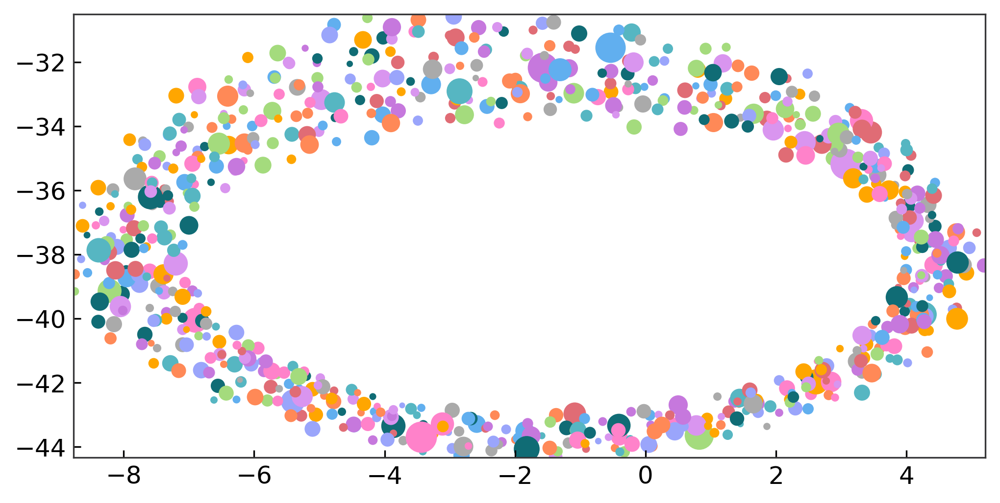

In [792]:
for i, e in enumerate(elm_centers[roi]):
    plt.scatter(e[0], e[1], s=(1+field[i])**20)
# elm_centers[roi][100, :], field[100]

In [784]:
# get norm electric field
field = gray_matter.field["normE"][:]
#field = gray_matter.field['E_normal'][:]
# Calculate the mean
mean_normE = np.average(field[roi], weights=elm_vols[roi])

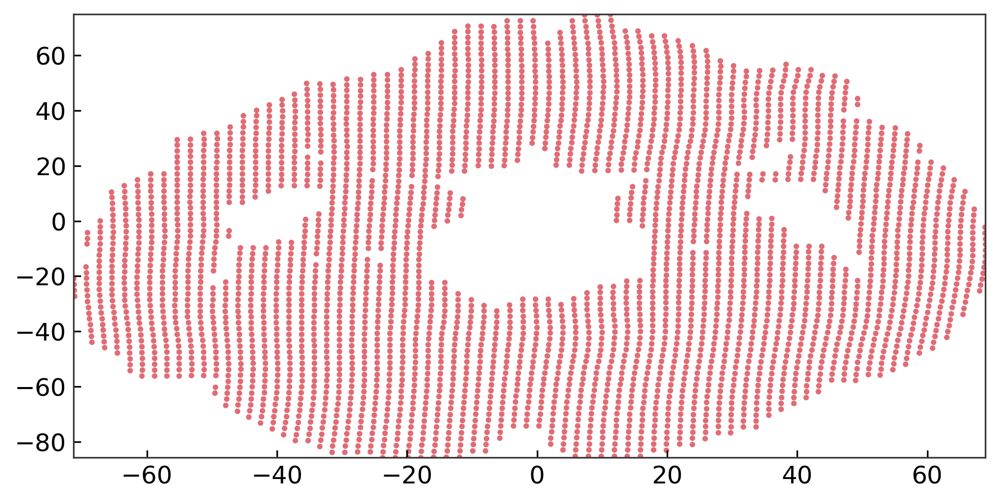

In [785]:
plt.scatter(area_subject_coords[:, 0], area_subject_coords[:, 1], s=3)


Dataset created in /home/cakan/nilearn_data/neurovault



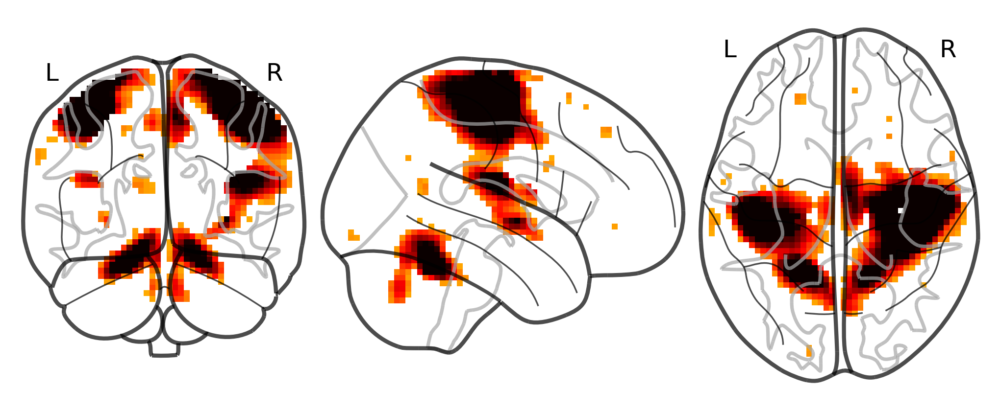

In [526]:
from nilearn import plotting
from nilearn import datasets

motor_images = datasets.fetch_neurovault_motor_task()
stat_img = motor_images.images[0]

plotting.plot_glass_brain(stat_img, threshold=3)

# Old

In [13]:
'''
https://simnibs.github.io/simnibs/build/html/tutorial/analysis.html

Simple ROI analysis of the electric field from a simulation.

We will calculate the mean electric field in a gray matter ROI defined around M1
'''
import os
import numpy as np
import simnibs

## Load simulation result

# Read the simulation result
# head_mesh = simnibs.read_msh(
#     os.path.join('tdcs', 'ernie_TDCS_1_scalar.msh')
# )
head_mesh = simnibs.read_msh("/Users/caglar/Downloads/Web/simnibs_examples/ernie/simnibs_simulation/ernie_TDCS_1_scalar.msh")

# Crop the mesh so we only have gray matter volume elements (tag 2 in the mesh)
gray_matter = head_mesh.crop_mesh(2)
# Electric fields are defined in the center of the elements
# get element centers
elm_centers = gray_matter.elements_baricenters()[:]
print(elm_centers.shape)
# get the element volumes, we will use those for averaging
elm_vols = gray_matter.elements_volumes_and_areas()[:]
print(elm_vols.shape)

(980931, 3)
(980931,)


In [166]:
head_mesh.view()

In [163]:
head_mesh.elm.triangles.shape

(986931,)

In [15]:
len(gray_matter.elm.triangles)

0

# Faster masking 

In [88]:
img = nib.load("data/aal/aal2.nii.gz")
head_mesh = simnibs.read_msh("data/ernie/simnibs_simulation_off_phase/ernie_TDCS_1_scalar.msh")
gray_matter = head_mesh.crop_mesh(2)
elm_centers = gray_matter.elements_baricenters()[:]
elm_vols = gray_matter.elements_volumes_and_areas()[:]

In [23]:
## Define the ROI
# coordinates of the ROI (np.argwhere(data==107)) need to be transformed to MNI space first using apply_affine
area_mni_coords = np.array([np.int_(np.round(x)) for x in apply_affine(img.affine , np.argwhere(data==53))])
area_subject_coords = simnibs.mni2subject_coords(area_mni_coords, '/Users/caglar/Downloads/Web/simnibs_examples/ernie/m2m_ernie/')

In [120]:
elm_centers - elm_centers.T

ValueError: operands could not be broadcast together with shapes (980931,3) (3,980931) 

In [117]:
np.diff(elm_centers)

array([[ 40.59986118,  -9.11129277],
       [-68.83260968,  17.19058952],
       [ 65.05851625,  -8.6449615 ],
       ...,
       [  6.94164955, 103.75268292],
       [-43.43833233,  64.90678103],
       [ -7.16066416,  20.10170596]])

In [94]:
r = 3.
roi_true = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])

In [97]:
for i in range(5):
    if i == 2:
        continue
    print(i)

0
1
3
4


In [105]:
len(elm_centers)

980931

In [116]:
import tqdm
import numba

#@numba.njit()
def compuite_roi():
    roi = np.zeros_like(elm_centers)
    #for i, f in tqdm.tqdm(enumerate(elm_centers)):
    r = 3
    r_sq = 9    
    for i, f in enumerate(elm_centers):
        for j, a in enumerate(area_subject_coords):
            d = f - a
            norm = d[0]**2+d[1]**2+d[2]**2
            # replace np.linal.norm()
            if norm < r_sq:
                roi[i] = True
                continue
    return roi

In [111]:
roi = compuite_roi()

KeyboardInterrupt: 

In [115]:
%load_ext line_profiler
%lprun  -T lprof0 -f compuite_roi compuite_roi()    

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler
*** KeyboardInterrupt exception caught in code being profiled.
*** Profile printout saved to text file 'lprof0'. *** KeyboardInterrupt exception caught in code being profiled.


Timer unit: 1e-06 s

Total time: 7.3452 s
File: <ipython-input-114-d207b81f729c>
Function: compuite_roi at line 5

Line #      Hits         Time  Per Hit   % Time  Line Contents
     5                                           def compuite_roi():
     6         1       3331.0   3331.0      0.0      roi = np.zeros_like(elm_centers)
     7                                               #for i, f in tqdm.tqdm(enumerate(elm_centers)):
     8         1          2.0      2.0      0.0      r = 3
     9         1          1.0      1.0      0.0      r_sq = 9    
    10       370        421.0      1.1      0.0      for i, f in enumerate(elm_centers):
    11    505339     257900.0      0.5      3.5          for j, a in enumerate(area_subject_coords):
    12    504970     477527.0      0.9      6.5              d = f - a
    13    504970     956183.0      1.9     13.0              norm = d[0]**2+d[1]**2+d[2]**2
    14    504970    5300892.0     10.5     72.2              np.linalg.norm(f - a)
    1

In [92]:
elm_centers[0]

array([-41.2696262 ,  -0.66976502,  -9.78105778])

In [83]:
roi_mask_affine = np.zeros_like(data)
roi_coords_affine = apply_affine(img.affine , np.argwhere(data==53))
roi_coords_affine = roi_coords_affine.astype(np.int)
# need to move the coordinates to the origin
roi_coords_affine[:, 0]+=np.abs(np.min(roi_coords_affine[:, 0]))
roi_coords_affine[:, 1]+=np.abs(np.min(roi_coords_affine[:, 1]))
roi_coords_affine[:, 2]+=np.abs(np.min(roi_coords_affine[:, 2]))

for c in roi_coords_affine:
    roi_mask_affine[c[0], c[1], c[2]] = 1

In [73]:
roi_mask_affine.shape

(91, 109, 91)

In [75]:
roi_mask_affine[26, 0, 10]

0.0

In [82]:
roi_mask_affine[c.T].shape

(3, 109, 91)

In [49]:
#roi_coords_affine

In [50]:
roi_coords_affine[0]

array([26.,  0., 10.])

In [30]:
apply_affine(img.affine , np.argwhere(data==53)).shape

(1366, 3)

In [25]:
simnibs.subject2mni_coords

(1366, 3)

In [63]:
simnibs.mni2subject_coords((data==53), '/Users/caglar/Downloads/Web/simnibs_examples/ernie/m2m_ernie/')

AttributeError: module 'simnibs' has no attribute 'mni2subject'

In [103]:
# determine the elements in the ROI
# roi includes all coordinates that are less than r mm away from the MNI-transformed ROI
r = 3.
roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])
print(np.sum(roi))

11283


In [50]:
%time roi = np.array([True if np.any(np.linalg.norm(f - area_subject_coords, axis=1) < r) else False for f in elm_centers])

CPU times: user 39.4 s, sys: 1.12 s, total: 40.6 s
Wall time: 40.7 s


In [53]:
roi = np.zeros((elm_centers.shape[0], ))

In [65]:
area_subject_coords.shape

(1366, 3)

In [66]:
idx = np.array(np.where( np.round(data) == 53 ) ).T

In [68]:
idx.shape

(1366, 3)

In [79]:
roi_mask = np.zeros(elm_centers.shape)
idx = np.array(np.where( data == 53 ) ).T
roi_mask[idx] = 1

In [84]:
roi_mask.shape

(980931, 3)

In [85]:
roi.shape

(980931,)

In [100]:
roi_mask.reshape(roi.shape)

ValueError: cannot reshape array of size 2942793 into shape (980931,)

In [29]:
a = area_subject_coords[123]
f = elm_centers[12333]

In [37]:
(f - area_subject_coords).shape

(1366, 3)

In [38]:
(a - elm_centers).shape

(980931, 3)

In [46]:
np.sum(np.linalg.norm(a - elm_centers, axis=1) < r)

89

In [28]:
elm_centers.shape

(980931, 3)

In [21]:
%load_ext line_profiler

In [18]:
import numba
import tqdm 

#@numba.njit()
def em_roi(subject_coords, elm_centers, radius):
    roi = np.zeros((elm_centers.shape[0],))
    radius_sq = radius**2
    for i in tqdm.tqdm(range(len(roi))):
    #for i in range(len(roi)):
        f = elm_centers[i]
        inside = 0
        for s in subject_coords:
            a = f - s
            norm_a = a[0]**2+a[1]**2+a[2]**2
            if norm_a < radius_sq:
                inside = 1
                break
            roi[i] = inside
#         if np.any(np.linalg.norm(f - subject_coords, axis=1) < r):
#             roi[i] = 1
    return roi
            
#%lprun  -T lprof0 -f em_roi em_roi(area_subject_coords, elm_centers, radius=3)    
roi2 = em_roi(area_subject_coords, elm_centers, radius=3)    

print(np.sum(roi))

100%|██████████| 980931/980931 [1:13:04<00:00, 223.73it/s]


11283


In [22]:
np.sum(roi - roi2)

11283.0

In [20]:
roi2.shape

(980931,)

In [193]:
subject_coords

array([[ -1.17137015, -82.31069946,  -9.22363472],
       [ -1.27491379, -82.59866333,  -7.53963137],
       [ -1.0573827 , -80.23925781,  -8.81860638],
       ...,
       [-56.96506882, -47.45631027, -13.60838318],
       [-56.94369125, -45.19918823, -15.11362267],
       [-57.03029633, -45.44628906, -13.33508492]])

In [ ]:
em_roi(area_subject_coords, elm_centers, radius=3)

In [23]:
## Plot the ROI
gray_matter.add_element_field(roi, 'roi')
gray_matter.view(visible_fields='roi').show()

In [104]:
## Get field and calculate the mean
# get the field of interest
field_name = 'normE'
field = gray_matter.field[field_name][:]

# Calculate the mean
mean_normE = np.average(field[roi], weights=elm_vols[roi])
print('mean ', field_name, ' in ROI: ', mean_normE)

mean  normE  in ROI:  0.12265425468269514


# Tmp

In [117]:
gray_matter.elements_baricenters()[:]

array([[-34.47111367,  -7.53362567,  37.42989733],
       [-33.858107  ,  -7.94520267,  37.53915667],
       [-34.60954267,  -6.992637  ,  37.113664  ],
       ...,
       [-29.20447615, -22.2628266 ,  81.48985632],
       [-19.58887167, -63.027204  ,   1.87957703],
       [-28.21702034, -35.37768451, -15.27597855]])

In [100]:
np.sum(gray_matter.triangle_normals()[:])

0.0

In [93]:
gray_matter.add_node_field(roi, 'roi')

ValueError: Number of data points in the field and of mesh nodes do not match

In [92]:
gray_matter.nodes_areas()

array([0, 0, 0, ..., 0, 0, 0])

(array([8.92758e+05, 7.53400e+04, 1.05800e+04, 1.93700e+03, 2.78000e+02,
        3.40000e+01, 1.00000e+00, 1.00000e+00, 1.00000e+00, 1.00000e+00]),
 array([4.84507686e-04, 1.30915120e+00, 2.61781788e+00, 3.92648457e+00,
        5.23515126e+00, 6.54381795e+00, 7.85248464e+00, 9.16115133e+00,
        1.04698180e+01, 1.17784847e+01, 1.30871514e+01]),
 <BarContainer object of 10 artists>)

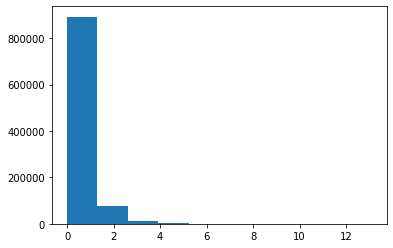

In [89]:
plt.hist(elm_vols)

In [ ]:
#elm_centers - subject_coords[:, None]

In [40]:
mni_coords.shape

(978, 3)

In [41]:
subject_coords.shape

(978, 3)

In [42]:
np.sum(roi)

55961

In [165]:
np.linalg.norm(elm_centers - subject_coords, axis=1) < r

ValueError: operands could not be broadcast together with shapes (980931,3) (2992,3) 

In [44]:
r = 10

In [45]:
roi = np.array([True if np.any(np.linalg.norm(f - subject_coords, axis=1) < r) else False for f in elm_centers])

In [46]:
np.sum(roi)

277

In [154]:
r

10.0

In [13]:
def 
for f in elm_centers:
    yup = np.any(np.linalg.norm(f - subject_coords, axis=1) < 30)
    if yup:
        print('yup')
        break

NameError: name 'elm_centers' is not defined

In [146]:
np.any(np.linalg.norm(f - subject_coords, axis=1)< 200)

True

In [144]:
subject_coords.shape

(2147, 3)

In [88]:
data.shape

(91, 109, 91)

In [137]:
subject_coords.shape

(2147, 3)